**Trying only the Processed Dataset:**

In [ ]:
# ============================================================
# INSTALL REQUIRED LIBRARIES
# ============================================================

!pip install timm pillow-heif -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 71.9 MB/s eta 0:00:00


In [ ]:
# ============================================================
# IMPORTS
# ============================================================

import os
import re
import torch
import timm
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import pillow_heif
from tqdm import tqdm
from torchvision import transforms
from sklearn.metrics.pairwise import cosine_similarity

pillow_heif.register_heif_opener()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [ ]:
# ============================================================
# LOAD PROCESSED DATASET PATHS
# ============================================================

processed_path = Path("/content/drive/MyDrive/Diseases of date palm leaves dataset/Infected Date Palm Leaves Dataset/Processed")

image_extensions = [".jpg", ".jpeg", ".png", ".heic", ".HEIC", ".JPG", ".PNG"]

data = []

for class_folder in processed_path.iterdir():
    if class_folder.is_dir():
        class_name = class_folder.name

        for img_path in class_folder.iterdir():
            if img_path.suffix in image_extensions:
                data.append({
                    "path": str(img_path),
                    "label": class_name,
                    "filename": img_path.name
                })

processed_df = pd.DataFrame(data)

print("Total processed images:", len(processed_df))
print(processed_df["label"].value_counts())
processed_df.head()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ============================================================
# LOAD PROCESSED DATASET PATHS
# ============================================================

processed_path = Path("/content/drive/MyDrive/Diseases of date palm leaves dataset/Diseases of date palm leaves dataset/Infected Date Palm Leaves Dataset/Processed")

image_extensions = [".jpg", ".jpeg", ".png", ".heic", ".HEIC", ".JPG", ".PNG"]

data = []

for class_folder in processed_path.iterdir():
    if class_folder.is_dir():
        class_name = class_folder.name

        for img_path in class_folder.iterdir():
            if img_path.suffix in image_extensions:
                data.append({
                    "path": str(img_path),
                    "label": class_name,
                    "filename": img_path.name
                })

processed_df = pd.DataFrame(data)

print("Total processed images:", len(processed_df))
print(processed_df["label"].value_counts())
processed_df.head()

Total processed images: 3089
label
1. Potassium Deficiency     831
3. Magnesium Deficiency     566
2. Manganese Deficiency     415
7. Rachis Blight            402
9. Healthy sample           389
6. Fusarium Wilt            210
4. Black Scorch             106
8. Parlatoria Blanchardi    101
5. Leaf Spots                69
Name: count, dtype: int64


,path,label,filename
0,/content/drive/MyDrive/Diseases of date palm l...,1. Potassium Deficiency,M9 (131).png
1,/content/drive/MyDrive/Diseases of date palm l...,1. Potassium Deficiency,M9 (104).png
2,/content/drive/MyDrive/Diseases of date palm l...,1. Potassium Deficiency,M9 (135).png
3,/content/drive/MyDrive/Diseases of date palm l...,1. Potassium Deficiency,M9 (118).png
4,/content/drive/MyDrive/Diseases of date palm l...,1. Potassium Deficiency,M9 (130).png


In [ ]:
# ============================================================
# LOAD DINOv2 MODEL
# Feature extractor for image embeddings
# ============================================================

dinov2_model = timm.create_model(
    "vit_small_patch14_dinov2.lvd142m",
    pretrained=True,
    num_classes=0
)

dinov2_model = dinov2_model.to(device)
dinov2_model.eval()

print("DINOv2 model loaded")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

DINOv2 model loaded


In [ ]:
# ============================================================
# IMAGE TRANSFORM FOR DINOv2
# DINOv2 model expects 518x518 input size
# ============================================================

embedding_transform = transforms.Compose([
    transforms.Resize((518, 518)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
# ============================================================
# EXTRACT IMAGE EMBEDDINGS
# ============================================================

embeddings = []

with torch.no_grad():
    for img_path in tqdm(processed_df["path"], desc="Extracting embeddings"):

        image = Image.open(img_path).convert("RGB")
        image = embedding_transform(image).unsqueeze(0).to(device)

        emb = dinov2_model(image)
        emb = emb.squeeze().cpu().numpy()

        embeddings.append(emb)

embeddings = np.array(embeddings)

print("Embeddings shape:", embeddings.shape)

Extracting embeddings:  49%|████▉     | 1507/3089 [15:17<15:17,  1.72it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Extracting embeddings: 100%|██████████| 3089/3089 [29:28<00:00,  1.75it/s]

Embeddings shape: (3089, 384)


In [ ]:
# ============================================================
# SAVE EMBEDDINGS AND DATAFRAME
# Save extracted DINOv2 embeddings to avoid recomputing them
# ============================================================

import numpy as np

np.save("/content/drive/MyDrive/dinov2_processed_embeddings.npy", embeddings)

processed_df.to_csv(
    "/content/drive/MyDrive/processed_df_with_paths.csv",
    index=False
)

print("Embeddings and dataframe saved successfully")

Embeddings and dataframe saved successfully


In [ ]:
# ============================================================
# EMBEDDING-BASED GROUPING
# Group highly similar images within the same class
# ============================================================

from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

threshold = 0.95

processed_df["embedding_group"] = None
group_counter = 0

for label in processed_df["label"].unique():

    class_indices = processed_df[processed_df["label"] == label].index.tolist()
    class_embeddings = embeddings[class_indices]

    sim_matrix = cosine_similarity(class_embeddings)

    assigned = set()

    for i, idx_i in enumerate(class_indices):
        if idx_i in assigned:
            continue

        group_name = f"{label}_embgroup_{group_counter}"
        group_counter += 1

        similar_positions = np.where(sim_matrix[i] >= threshold)[0]

        for pos in similar_positions:
            idx_j = class_indices[pos]
            processed_df.loc[idx_j, "embedding_group"] = group_name
            assigned.add(idx_j)

print("Embedding groups created successfully")
print("Number of embedding groups:", processed_df["embedding_group"].nunique())

Embedding groups created successfully
Number of embedding groups: 2480


In [ ]:
# ============================================================
# CHECK EMBEDDING-BASED GROUPING RESULTS
# Verify whether visually similar images were grouped together
# ============================================================

group_sizes = processed_df["embedding_group"].value_counts()

print("Total embedding groups:",
      processed_df["embedding_group"].nunique())

print("Groups containing more than one image:",
      (group_sizes > 1).sum())

print("\nLargest groups:")
print(group_sizes.head(20))

Total embedding groups: 2480
Groups containing more than one image: 536

Largest groups:
embedding_group
3. Magnesium Deficiency_embgroup_1421    6
1. Potassium Deficiency_embgroup_45      4
7. Rachis Blight_embgroup_2248           4
3. Magnesium Deficiency_embgroup_1218    4
3. Magnesium Deficiency_embgroup_1428    4
1. Potassium Deficiency_embgroup_26      4
2. Manganese Deficiency_embgroup_1061    4
2. Manganese Deficiency_embgroup_1009    4
7. Rachis Blight_embgroup_2296           4
3. Magnesium Deficiency_embgroup_1451    4
7. Rachis Blight_embgroup_2407           4
7. Rachis Blight_embgroup_2448           4
7. Rachis Blight_embgroup_2194           4
9. Healthy sample_embgroup_1576          3
9. Healthy sample_embgroup_1629          3
1. Potassium Deficiency_embgroup_67      3
7. Rachis Blight_embgroup_2366           3
3. Magnesium Deficiency_embgroup_1512    3
1. Potassium Deficiency_embgroup_297     3
3. Magnesium Deficiency_embgroup_1177    3
Name: count, dtype: int64


Selected group: 3. Magnesium Deficiency_embgroup_1421
Number of images in group: 6


,label,filename
1505,3. Magnesium Deficiency,M6 (271).png
1642,3. Magnesium Deficiency,M6 (304).png
1748,3. Magnesium Deficiency,M6 (499).png
1770,3. Magnesium Deficiency,M6 (502).png
1875,3. Magnesium Deficiency,M6 (73).png
1886,3. Magnesium Deficiency,M6 (556).png


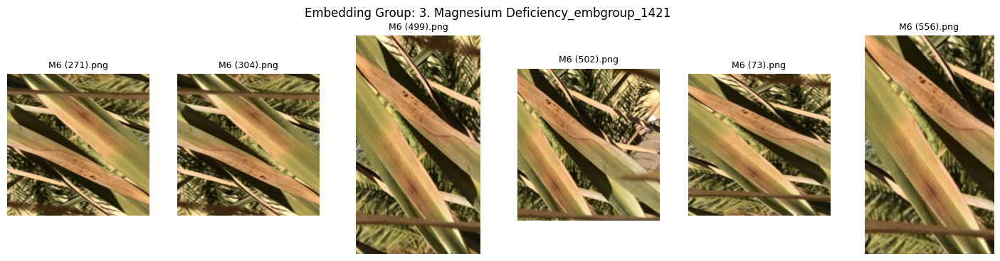

Selected group: 1. Potassium Deficiency_embgroup_45
Number of images in group: 4


,label,filename
45,1. Potassium Deficiency,M9 (139).png
554,1. Potassium Deficiency,M9 (616).png
671,1. Potassium Deficiency,M9 (657).png
679,1. Potassium Deficiency,M9 (657)(1).png


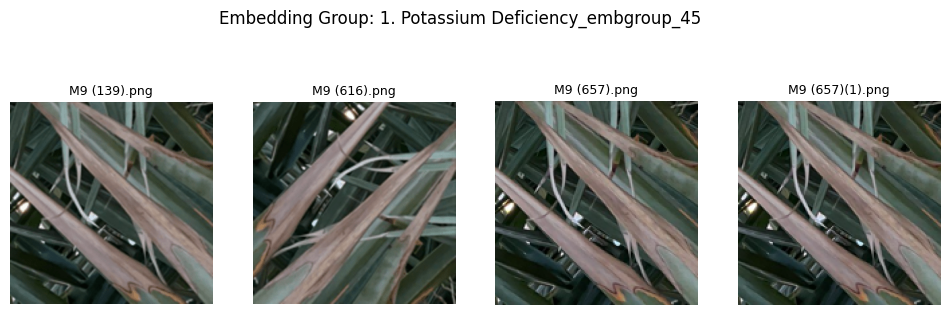

Selected group: 7. Rachis Blight_embgroup_2248
Number of images in group: 4


,label,filename
2742,7. Rachis Blight,M5 (169).png
2745,7. Rachis Blight,M5 (16).png
2939,7. Rachis Blight,M5 (272).png
2989,7. Rachis Blight,M5 (381).png


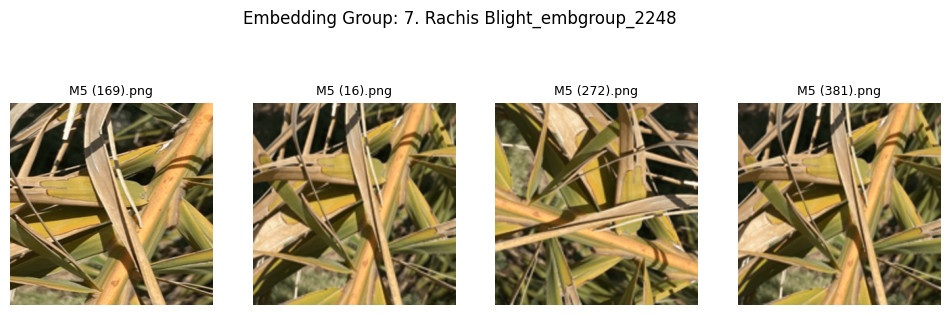

Selected group: 3. Magnesium Deficiency_embgroup_1218
Number of images in group: 4


,label,filename
1494,3. Magnesium Deficiency,M6 (200).png
1709,3. Magnesium Deficiency,M6 (418).png
1826,3. Magnesium Deficiency,M6 (559).png
1896,3. Magnesium Deficiency,M6 (80).png


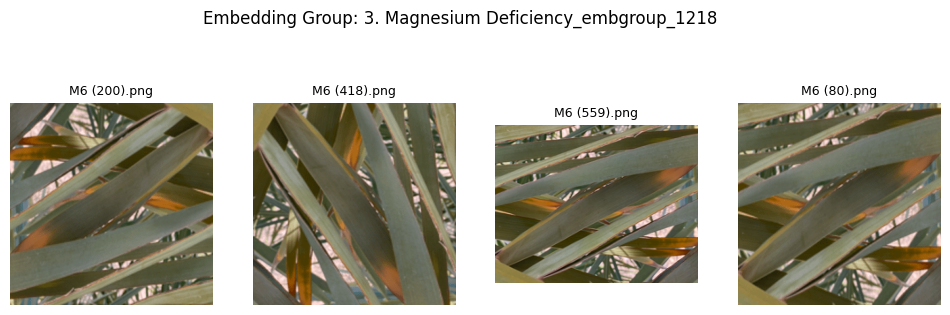

Selected group: 3. Magnesium Deficiency_embgroup_1428
Number of images in group: 4


,label,filename
1756,3. Magnesium Deficiency,M6 (495).png
1814,3. Magnesium Deficiency,M6 (553).png
1820,3. Magnesium Deficiency,M6 (549).png
1876,3. Magnesium Deficiency,M6 (69).png


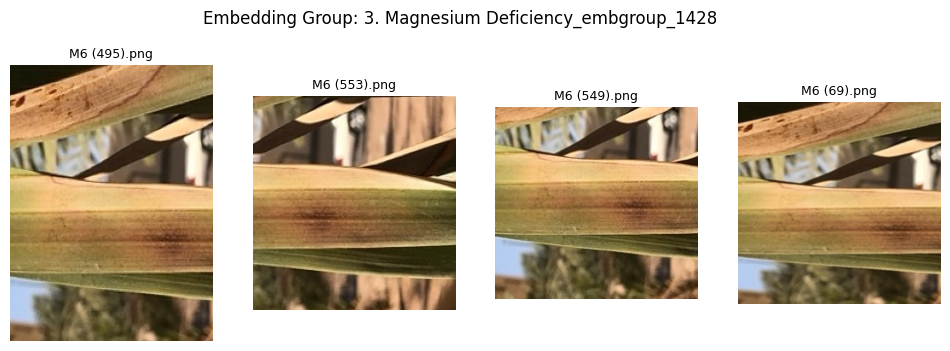

Selected group: 1. Potassium Deficiency_embgroup_26
Number of images in group: 4


,label,filename
26,1. Potassium Deficiency,M9 (14).png
253,1. Potassium Deficiency,M9 (322).png
281,1. Potassium Deficiency,M9 (352).png
772,1. Potassium Deficiency,M9 (803).png


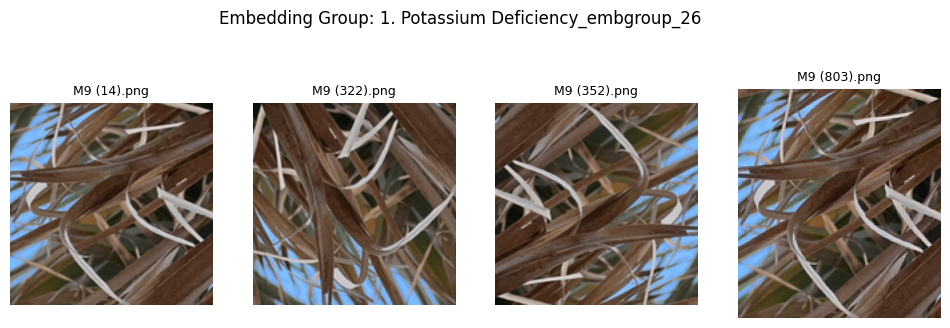

Selected group: 2. Manganese Deficiency_embgroup_1061
Number of images in group: 4


,label,filename
1067,2. Manganese Deficiency,M7 (180).png
1290,2. Manganese Deficiency,M7 (395).png
1303,2. Manganese Deficiency,M7 (400).png
1328,2. Manganese Deficiency,M7 (8).png


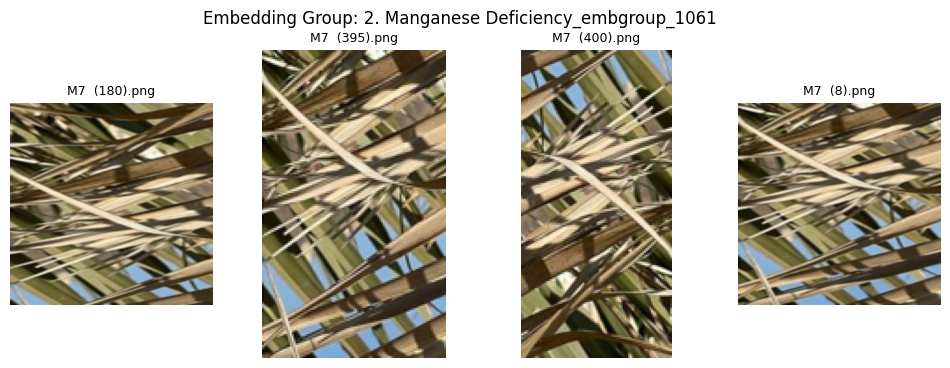

Selected group: 2. Manganese Deficiency_embgroup_1009
Number of images in group: 4


,label,filename
1215,2. Manganese Deficiency,M7 (38).png
1239,2. Manganese Deficiency,M7 (391).png
1257,2. Manganese Deficiency,M7 (383).png
1265,2. Manganese Deficiency,M7 (4).png


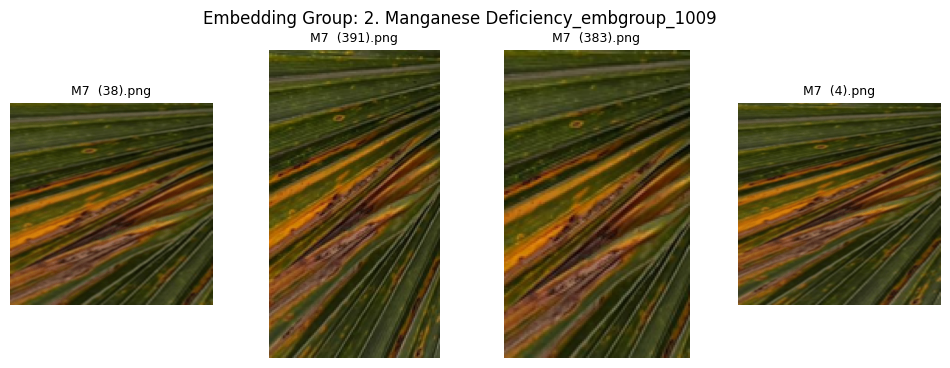

In [ ]:
# ============================================================
# VISUALIZE MULTIPLE EMBEDDING GROUPS
# Display several groups to manually verify visual similarity
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image

# Select groups that contain more than one image
multi_image_groups = group_sizes[group_sizes > 1].head(8)

for group_name, group_count in multi_image_groups.items():

    sample_group = processed_df[
        processed_df["embedding_group"] == group_name
    ]

    print("=" * 80)
    print("Selected group:", group_name)
    print("Number of images in group:", group_count)
    display(sample_group[["label", "filename"]])

    # Display up to 6 images from this group
    num_images = min(6, len(sample_group))

    plt.figure(figsize=(3 * num_images, 4))

    for i, path in enumerate(sample_group["path"].head(num_images)):
        img = Image.open(path).convert("RGB")

        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(sample_group.iloc[i]["filename"], fontsize=9)
        plt.axis("off")

    plt.suptitle(f"Embedding Group: {group_name}", fontsize=12)
    plt.show()

In [ ]:
# ============================================================
# CHECK SIMILARITY FOR MULTIPLE VISUALIZED GROUPS
# ============================================================

from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Select groups containing more than one image
multi_image_groups = group_sizes[group_sizes > 1].head(8)

for group_name, group_count in multi_image_groups.items():

    sample_group = processed_df[
        processed_df["embedding_group"] == group_name
    ]

    idxs = sample_group.index.tolist()

    sims = cosine_similarity(embeddings[idxs])

    # Ignore diagonal (self similarity)
    upper_triangle = sims[np.triu_indices_from(sims, k=1)]

    print("=" * 80)
    print("Group:", group_name)
    print("Number of images:", group_count)

    print("Minimum similarity:",
          round(upper_triangle.min(), 4))

    print("Average similarity:",
          round(upper_triangle.mean(), 4))

    print("Maximum similarity:",
          round(upper_triangle.max(), 4))

Group: 3. Magnesium Deficiency_embgroup_1421
Number of images: 6
Minimum similarity: 0.9289
Average similarity: 0.9595
Maximum similarity: 1.0
Group: 1. Potassium Deficiency_embgroup_45
Number of images: 4
Minimum similarity: 0.9344
Average similarity: 0.9607
Maximum similarity: 1.0
Group: 7. Rachis Blight_embgroup_2248
Number of images: 4
Minimum similarity: 0.9305
Average similarity: 0.9622
Maximum similarity: 1.0
Group: 3. Magnesium Deficiency_embgroup_1218
Number of images: 4
Minimum similarity: 0.9431
Average similarity: 0.9652
Maximum similarity: 0.9857
Group: 3. Magnesium Deficiency_embgroup_1428
Number of images: 4
Minimum similarity: 0.9339
Average similarity: 0.9567
Maximum similarity: 0.9792
Group: 1. Potassium Deficiency_embgroup_26
Number of images: 4
Minimum similarity: 0.9268
Average similarity: 0.9481
Maximum similarity: 0.9757
Group: 2. Manganese Deficiency_embgroup_1061
Number of images: 4
Minimum similarity: 0.9417
Average similarity: 0.9616
Maximum similarity: 0.985

In [ ]:
# ============================================================
# GROUP-SAFE SPLIT USING EMBEDDING GROUPS
# This reduces leakage by keeping visually similar images
# in the same split
# ============================================================

from sklearn.model_selection import GroupShuffleSplit

# First split: 70% train, 30% temporary
gss1 = GroupShuffleSplit(
    n_splits=1,
    train_size=0.70,
    random_state=42
)

train_idx, temp_idx = next(
    gss1.split(
        processed_df,
        groups=processed_df["embedding_group"]
    )
)

train_df = processed_df.iloc[train_idx].reset_index(drop=True)
temp_df = processed_df.iloc[temp_idx].reset_index(drop=True)

# Second split: 15% validation, 15% test
gss2 = GroupShuffleSplit(
    n_splits=1,
    train_size=0.50,
    random_state=42
)

val_idx, test_idx = next(
    gss2.split(
        temp_df,
        groups=temp_df["embedding_group"]
    )
)

val_df = temp_df.iloc[val_idx].reset_index(drop=True)
test_df = temp_df.iloc[test_idx].reset_index(drop=True)

print("Train:", len(train_df))
print("Val:", len(val_df))
print("Test:", len(test_df))

# Leakage check
train_groups = set(train_df["embedding_group"])
val_groups = set(val_df["embedding_group"])
test_groups = set(test_df["embedding_group"])

print("\nLeakage check:")
print("Train-Val overlap:", len(train_groups & val_groups))
print("Train-Test overlap:", len(train_groups & test_groups))
print("Val-Test overlap:", len(val_groups & test_groups))

Train: 2171
Val: 468
Test: 450

Leakage check:
Train-Val overlap: 0
Train-Test overlap: 0
Val-Test overlap: 0


In [ ]:
# ============================================================
# SAVE EMBEDDING-BASED SPLITS AND EMBEDDINGS
# ============================================================

save_folder = "/content/drive/MyDrive/Computer Vision Project"

train_df.to_csv(
    f"{save_folder}/train_processed_embedding_split.csv",
    index=False
)

val_df.to_csv(
    f"{save_folder}/val_processed_embedding_split.csv",
    index=False
)

test_df.to_csv(
    f"{save_folder}/test_processed_embedding_split.csv",
    index=False
)

processed_df.to_csv(
    f"{save_folder}/processed_df_with_embedding_groups.csv",
    index=False
)

np.save(
    f"{save_folder}/dinov2_processed_embeddings.npy",
    embeddings
)

print("All files saved successfully")

All files saved successfully


**Start Training with Swin Transformer**

In [ ]:
# ============================================================
# LOAD EMBEDDING-BASED SPLITS
# ============================================================

import pandas as pd

save_folder = "/content/drive/MyDrive/Computer Vision Project"

train_df = pd.read_csv(f"{save_folder}/train_processed_embedding_split.csv")
val_df = pd.read_csv(f"{save_folder}/val_processed_embedding_split.csv")
test_df = pd.read_csv(f"{save_folder}/test_processed_embedding_split.csv")

print("Train:", len(train_df))
print("Val:", len(val_df))
print("Test:", len(test_df))

print("\nTrain class counts:")
print(train_df["label"].value_counts())

Train: 2171
Val: 468
Test: 450

Train class counts:
label
1. Potassium Deficiency     574
3. Magnesium Deficiency     395
2. Manganese Deficiency     304
9. Healthy sample           281
7. Rachis Blight            269
6. Fusarium Wilt            154
8. Parlatoria Blanchardi     79
4. Black Scorch              71
5. Leaf Spots                44
Name: count, dtype: int64


In [ ]:
# ============================================================
# LABEL ENCODING
# ============================================================

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
label_encoder.fit(train_df["label"])

num_classes = len(label_encoder.classes_)

print("Classes:")
print(label_encoder.classes_)
print("\nNumber of classes:", num_classes)

Classes:
['1. Potassium Deficiency' '2. Manganese Deficiency'
 '3. Magnesium Deficiency' '4. Black Scorch' '5. Leaf Spots'
 '6. Fusarium Wilt' '7. Rachis Blight' '8. Parlatoria Blanchardi'
 '9. Healthy sample']

Number of classes: 9


In [ ]:
# ============================================================
# INSTALL / IMPORT LIBRARIES
# ============================================================

!pip install timm pillow-heif -q

import torch
import timm
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import pillow_heif

from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

pillow_heif.register_heif_opener()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [ ]:
# ============================================================
# IMAGE TRANSFORMS
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224, scale=(0.75, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

print("Transforms created successfully")

Transforms created successfully


In [ ]:
# ============================================================
# CUSTOM DATASET
# ============================================================

class PalmDataset(Dataset):

    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]["path"]
        label_name = self.dataframe.iloc[idx]["label"]

        label = label_encoder.transform([label_name])[0]

        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

In [ ]:
# ============================================================
# DATASETS AND DATALOADERS
# ============================================================

train_dataset = PalmDataset(train_df, transform=train_transform)
val_dataset = PalmDataset(val_df, transform=val_test_transform)
test_dataset = PalmDataset(test_df, transform=val_test_transform)

batch_size = 16

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2
)

print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train batches: 136
Val batches: 30
Test batches: 29


In [ ]:
# ============================================================
# SWIN TRANSFORMER MODEL
# ============================================================

model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=num_classes
)

model = model.to(device)

print("Swin Transformer loaded successfully")

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Swin Transformer loaded successfully


In [ ]:
# ============================================================
# LOSS FUNCTION AND OPTIMIZER
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

print("Loss and optimizer created successfully")

Loss and optimizer created successfully


In [ ]:
# ============================================================
# TRAINING LOOP
# ============================================================

num_epochs = 10
best_val_acc = 0.0

for epoch in range(num_epochs):

    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

    train_acc = train_correct / train_total
    avg_train_loss = train_loss / len(train_loader)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_acc = val_correct / val_total
    avg_val_loss = val_loss / len(val_loader)

    print(f"\nEpoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss:   {avg_val_loss:.4f} | Val Acc:   {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            "/content/drive/MyDrive/Computer Vision Project/best_swin_processed_model.pth"
        )

        print("Best model saved!")

Epoch 1/10 - Training:   1%|          | 1/136 [00:01<03:14,  1.44s/it]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  10%|█         | 14/136 [00:04<00:27,  4.39it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  26%|██▋       | 36/136 [00:09<00:23,  4.24it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  29%|██▉       | 40/136 [00:10<00:23,  4.08it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - 


Epoch [1/10]
Train Loss: 0.7865 | Train Acc: 0.7282
Val Loss:   0.4622 | Val Acc:   0.8312
Best model saved!


Epoch 2/10 - Training:  15%|█▍        | 20/136 [00:06<00:25,  4.53it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  30%|███       | 41/136 [00:10<00:20,  4.72it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  34%|███▍      | 46/136 [00:11<00:19,  4.67it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  49%|████▉     | 67/136 [00:16<00:21,  3.15it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 -


Epoch [2/10]
Train Loss: 0.2617 | Train Acc: 0.9120
Val Loss:   0.2322 | Val Acc:   0.9274
Best model saved!


Epoch 3/10 - Training:   0%|          | 0/136 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  16%|█▌        | 22/136 [00:05<00:25,  4.54it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  32%|███▏      | 44/136 [00:13<01:39,  1.08s/it]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  58%|█████▊    | 79/136 [00:21<00:12,  4.47it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training


Epoch [3/10]
Train Loss: 0.1141 | Train Acc: 0.9632
Val Loss:   0.1825 | Val Acc:   0.9423
Best model saved!


Epoch 4/10 - Training:   0%|          | 0/136 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  12%|█▎        | 17/136 [00:04<00:26,  4.46it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  15%|█▌        | 21/136 [00:05<00:25,  4.57it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  62%|██████▎   | 85/136 [00:24<00:12,  3.97it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training


Epoch [4/10]
Train Loss: 0.0895 | Train Acc: 0.9687
Val Loss:   0.1841 | Val Acc:   0.9466
Best model saved!


Epoch 5/10 - Training:   5%|▌         | 7/136 [00:02<00:30,  4.17it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:   6%|▌         | 8/136 [00:02<00:29,  4.29it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:  13%|█▎        | 18/136 [00:04<00:26,  4.54it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:  16%|█▌        | 22/136 [00:05<00:25,  4.55it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - T


Epoch [5/10]
Train Loss: 0.0979 | Train Acc: 0.9719
Val Loss:   0.1834 | Val Acc:   0.9402


Epoch 6/10 - Training:   7%|▋         | 9/136 [00:02<00:28,  4.46it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  21%|██▏       | 29/136 [00:06<00:23,  4.54it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  24%|██▍       | 33/136 [00:07<00:22,  4.57it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  46%|████▋     | 63/136 [00:15<00:16,  4.53it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - 


Epoch [6/10]
Train Loss: 0.0635 | Train Acc: 0.9811
Val Loss:   0.1712 | Val Acc:   0.9509
Best model saved!


Epoch 7/10 - Training:  15%|█▌        | 21/136 [00:06<00:36,  3.11it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  24%|██▎       | 32/136 [00:09<00:23,  4.51it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  31%|███       | 42/136 [00:13<00:56,  1.68it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  40%|████      | 55/136 [00:16<00:18,  4.43it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 -


Epoch [7/10]
Train Loss: 0.0826 | Train Acc: 0.9724
Val Loss:   0.2266 | Val Acc:   0.9316


Epoch 8/10 - Training:   0%|          | 0/136 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  29%|██▉       | 40/136 [00:10<00:30,  3.15it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  46%|████▌     | 62/136 [00:15<00:16,  4.53it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  59%|█████▉    | 80/136 [00:19<00:12,  4.56it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training


Epoch [8/10]
Train Loss: 0.0898 | Train Acc: 0.9728
Val Loss:   0.2490 | Val Acc:   0.9444


Epoch 9/10 - Training:  30%|███       | 41/136 [00:10<00:20,  4.63it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  40%|████      | 55/136 [00:13<00:17,  4.57it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  45%|████▍     | 61/136 [00:15<00:16,  4.62it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  66%|██████▌   | 90/136 [00:22<00:10,  4.41it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 -


Epoch [9/10]
Train Loss: 0.0513 | Train Acc: 0.9834
Val Loss:   0.1860 | Val Acc:   0.9402


Epoch 10/10 - Training:  13%|█▎        | 18/136 [00:04<00:26,  4.48it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:  15%|█▌        | 21/136 [00:04<00:25,  4.54it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:  38%|███▊      | 52/136 [00:12<00:23,  3.51it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:  51%|█████▏    | 70/136 [00:16<00:14,  4.52it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/loc


Epoch [10/10]
Train Loss: 0.0287 | Train Acc: 0.9908
Val Loss:   0.3711 | Val Acc:   0.8932


In [ ]:
# ============================================================
# LOAD BEST SAVED MODEL
# ============================================================

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Computer Vision Project/best_swin_processed_model.pth",
        map_location=device
    )
)

model = model.to(device)
model.eval()

print("Best model loaded successfully")

Best model loaded successfully


In [ ]:
# ============================================================
# TEST SET EVALUATION
# ============================================================

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
import numpy as np

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = accuracy_score(all_labels, all_preds)
macro_f1 = f1_score(all_labels, all_preds, average="macro")

print("Test Accuracy:", round(test_acc, 4))
print("Macro F1-score:", round(macro_f1, 4))

print("\nClassification Report:")
print(
    classification_report(
        all_labels,
        all_preds,
        target_names=label_encoder.classes_
    )
)

Testing:  79%|███████▉  | 23/29 [00:06<00:01,  4.69it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Testing:  86%|████████▌ | 25/29 [00:07<00:01,  3.94it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Testing: 100%|██████████| 29/29 [00:07<00:00,  3.74it/s]

Test Accuracy: 0.9533
Macro F1-score: 0.9097

Classification Report:
                          precision    recall  f1-score   support

 1. Potassium Deficiency       0.99      1.00      1.00       128
 2. Manganese Deficiency       1.00      1.00      1.00        59
 3. Magnesium Deficiency       1.00      0.86      0.93        95
         4. Black Scorch       0.73      0.90      0.81        21
           5. Leaf Spots       0.75      0.82      0.78        11
        6. Fusarium Wilt       0.69      0.82      0.75        22
        7. Rachis Blight       1.00      1.00      1.00        59
8. Parlatoria Blanchardi       0.86      1.00      0.92        12
       9. Healthy sample       1.00      1.00      1.00        43

                accuracy                           0.95       450
               macro avg       0.89      0.93      0.91       450
            weighted avg       0.96      0.95      0.95       450



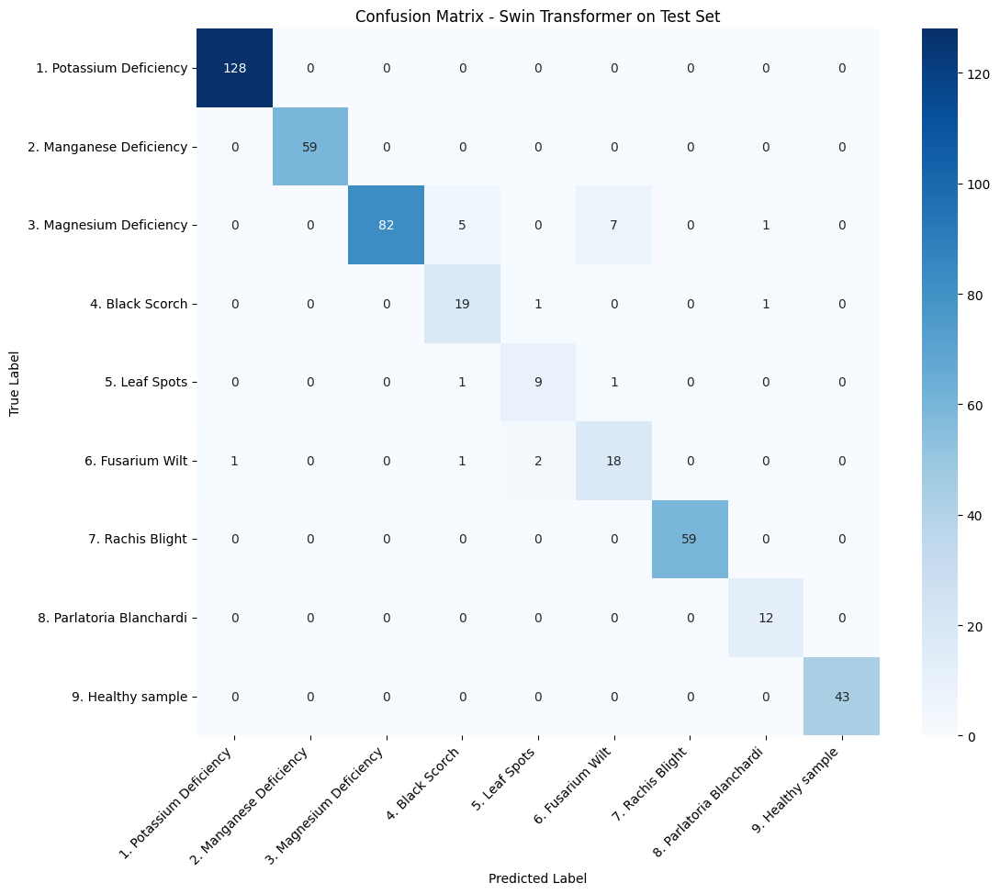

In [ ]:
# ============================================================
# CONFUSION MATRIX VISUALIZATION
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(12, 10))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Swin Transformer on Test Set")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()

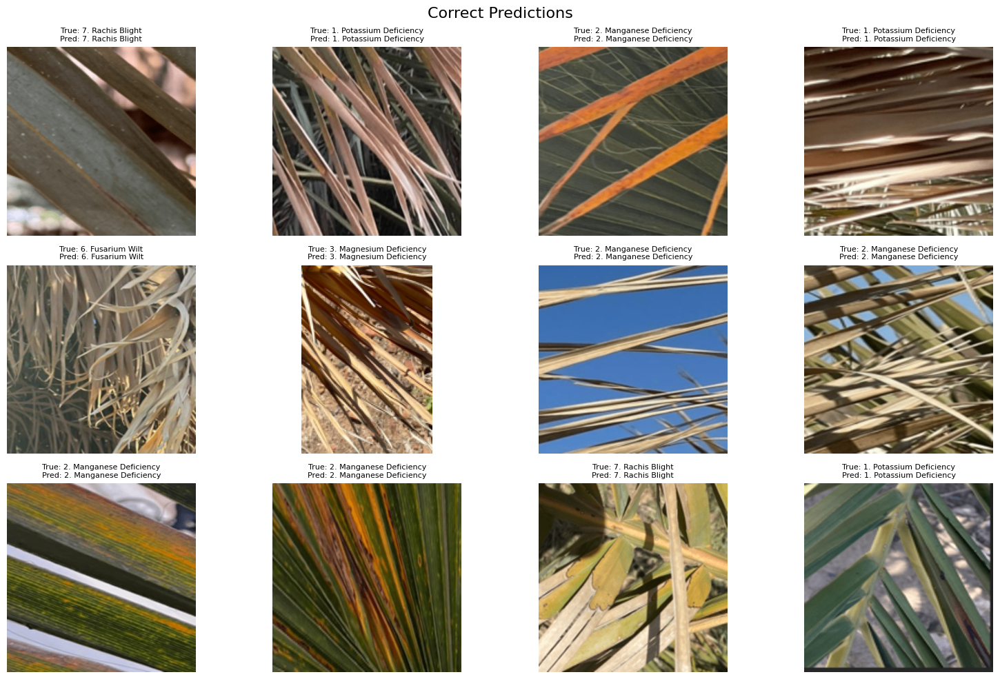

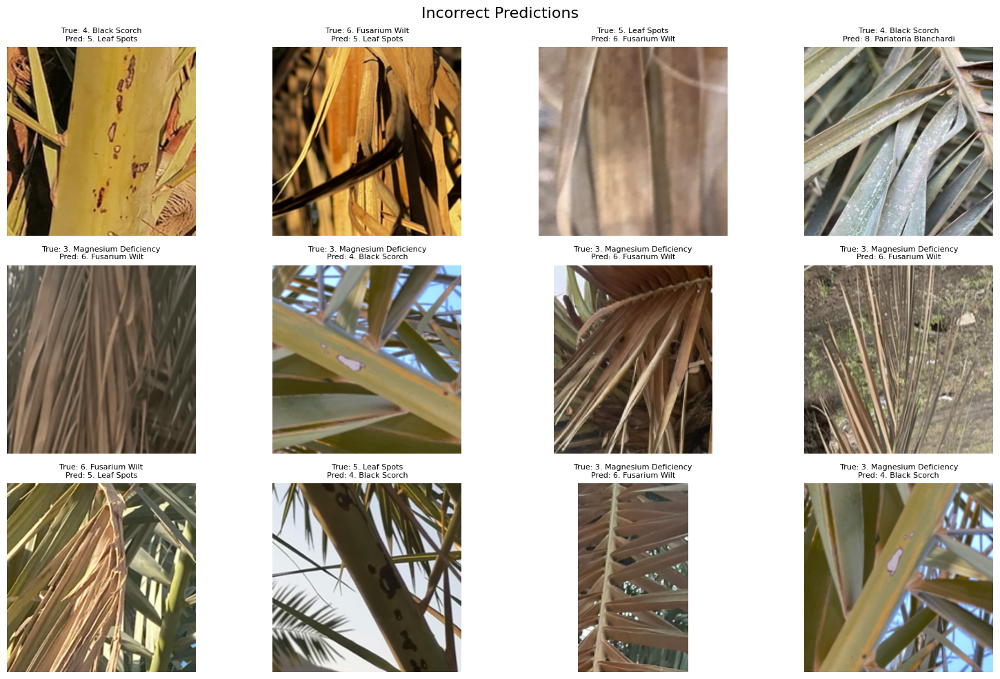

In [ ]:
# ============================================================
# VISUALIZE TEST PREDICTIONS
# Show correct and incorrect predictions
# ============================================================

import random
from PIL import Image

test_results = test_df.copy()
test_results["true_label"] = label_encoder.inverse_transform(all_labels)
test_results["predicted_label"] = label_encoder.inverse_transform(all_preds)
test_results["correct"] = test_results["true_label"] == test_results["predicted_label"]

def show_predictions(df, title, n=12):
    samples = df.sample(min(n, len(df)), random_state=42)

    plt.figure(figsize=(16, 10))

    for i, (_, row) in enumerate(samples.iterrows()):
        img = Image.open(row["path"]).convert("RGB")

        plt.subplot(3, 4, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"True: {row['true_label']}\nPred: {row['predicted_label']}",
            fontsize=8
        )

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_predictions(
    test_results[test_results["correct"] == True],
    "Correct Predictions",
    n=12
)

show_predictions(
    test_results[test_results["correct"] == False],
    "Incorrect Predictions",
    n=12
)

In [ ]:
# ============================================================
# SAVE TEST RESULTS
# ============================================================

test_results.to_csv(
    "/content/drive/MyDrive/Computer Vision Project/swin_test_predictions.csv",
    index=False
)

print("Test predictions saved successfully")

Test predictions saved successfully


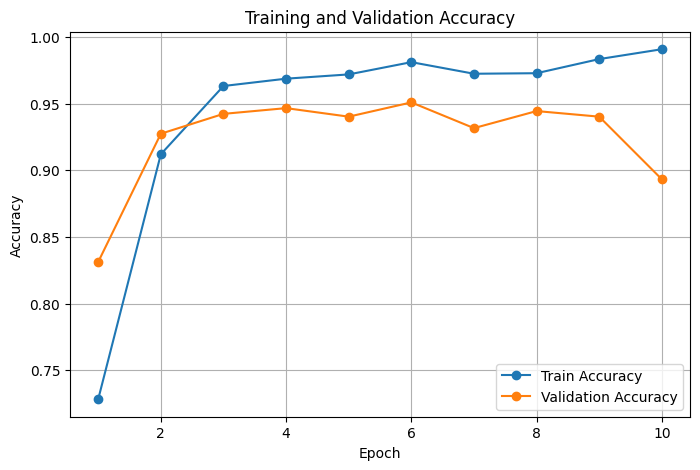

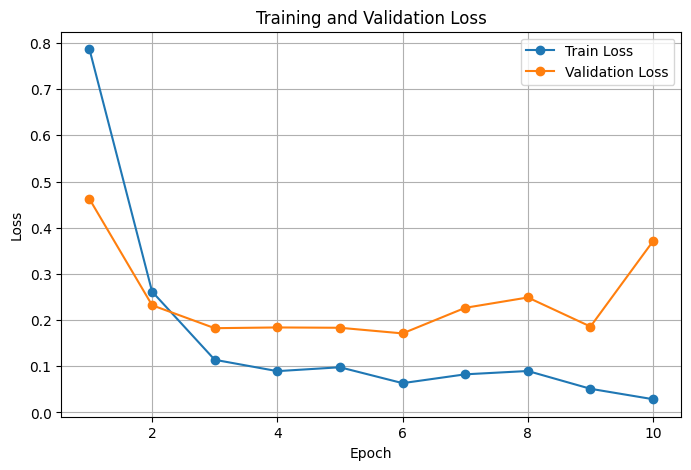

In [ ]:
import matplotlib.pyplot as plt

epochs = list(range(1, 11))

train_acc = [0.7282, 0.9120, 0.9632, 0.9687, 0.9719, 0.9811, 0.9724, 0.9728, 0.9834, 0.9908]
val_acc   = [0.8312, 0.9274, 0.9423, 0.9466, 0.9402, 0.9509, 0.9316, 0.9444, 0.9402, 0.8932]

train_loss = [0.7865, 0.2617, 0.1141, 0.0895, 0.0979, 0.0635, 0.0826, 0.0898, 0.0513, 0.0287]
val_loss   = [0.4622, 0.2322, 0.1825, 0.1841, 0.1834, 0.1712, 0.2266, 0.2490, 0.1860, 0.3711]

plt.figure(figsize=(8, 5))
plt.plot(epochs, train_acc, marker="o", label="Train Accuracy")
plt.plot(epochs, val_acc, marker="o", label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(epochs, train_loss, marker="o", label="Train Loss")
plt.plot(epochs, val_loss, marker="o", label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

**Trying to deal with and solving imbalance issue for the sake of getting higher accuracy !**

In [ ]:
criterion = nn.CrossEntropyLoss()

In [ ]:
# ============================================================
# CLASS WEIGHTS FOR IMBALANCE HANDLING
# Give higher importance to minority classes
# ============================================================

from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import torch
import torch.nn as nn

train_labels_numeric = label_encoder.transform(train_df["label"])

class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.arange(num_classes),
    y=train_labels_numeric
)

class_weights = torch.tensor(
    class_weights,
    dtype=torch.float
).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("Class weights:")
for class_name, weight in zip(label_encoder.classes_, class_weights.cpu().numpy()):
    print(f"{class_name}: {weight:.3f}")

Class weights:
1. Potassium Deficiency: 0.420
2. Manganese Deficiency: 0.793
3. Magnesium Deficiency: 0.611
4. Black Scorch: 3.397
5. Leaf Spots: 5.482
6. Fusarium Wilt: 1.566
7. Rachis Blight: 0.897
8. Parlatoria Blanchardi: 3.053
9. Healthy sample: 0.858


In [ ]:
model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=num_classes
)

model = model.to(device)

In [ ]:
optimizer = optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

In [ ]:
# ============================================================
# TRAINING LOOP WITH HISTORY
# Swin Transformer + Class Weights
# ============================================================

num_epochs = 10
best_val_acc = 0.0

history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": []
}

for epoch in range(num_epochs):

    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

    train_acc = train_correct / train_total
    avg_train_loss = train_loss / len(train_loader)

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_acc = val_correct / val_total
    avg_val_loss = val_loss / len(val_loader)

    history["train_loss"].append(avg_train_loss)
    history["val_loss"].append(avg_val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    print(f"\nEpoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss:   {avg_val_loss:.4f} | Val Acc:   {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            "/content/drive/MyDrive/Computer Vision Project/best_swin_processed_classweights_model.pth"
        )

        print("Best class-weights model saved!")

Epoch 1/10 - Training:  10%|█         | 14/136 [00:04<00:37,  3.24it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  26%|██▌       | 35/136 [00:09<00:22,  4.47it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  65%|██████▌   | 89/136 [00:25<00:13,  3.59it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 - Training:  66%|██████▌   | 90/136 [00:25<00:14,  3.28it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 1/10 -


Epoch [1/10]
Train Loss: 0.7660 | Train Acc: 0.7462
Val Loss:   0.3894 | Val Acc:   0.8782
Best class-weights model saved!


Epoch 2/10 - Training:  11%|█         | 15/136 [00:03<00:26,  4.61it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  37%|███▋      | 50/136 [00:12<00:21,  3.92it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  41%|████      | 56/136 [00:13<00:17,  4.55it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 - Training:  48%|████▊     | 65/136 [00:15<00:15,  4.65it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 2/10 -


Epoch [2/10]
Train Loss: 0.3284 | Train Acc: 0.8964
Val Loss:   0.4802 | Val Acc:   0.8397


Epoch 3/10 - Training:   8%|▊         | 11/136 [00:03<00:42,  2.96it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  22%|██▏       | 30/136 [00:08<00:23,  4.56it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  64%|██████▍   | 87/136 [00:21<00:11,  4.43it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 - Training:  76%|███████▌  | 103/136 [00:25<00:07,  4.44it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 3/10 


Epoch [3/10]
Train Loss: 0.2476 | Train Acc: 0.9134
Val Loss:   0.4716 | Val Acc:   0.8632


Epoch 4/10 - Training:  10%|▉         | 13/136 [00:03<00:27,  4.45it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  12%|█▏        | 16/136 [00:03<00:26,  4.56it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  24%|██▍       | 33/136 [00:07<00:23,  4.31it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 - Training:  29%|██▉       | 40/136 [00:09<00:25,  3.76it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 4/10 -


Epoch [4/10]
Train Loss: 0.1408 | Train Acc: 0.9544
Val Loss:   0.2927 | Val Acc:   0.9124
Best class-weights model saved!


Epoch 5/10 - Training:  11%|█         | 15/136 [00:04<00:37,  3.24it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:  15%|█▌        | 21/136 [00:06<00:29,  3.88it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:  32%|███▏      | 44/136 [00:13<00:45,  2.00it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 - Training:  36%|███▌      | 49/136 [00:14<00:24,  3.61it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 5/10 -


Epoch [5/10]
Train Loss: 0.0842 | Train Acc: 0.9673
Val Loss:   0.2674 | Val Acc:   0.9316
Best class-weights model saved!


Epoch 6/10 - Training:  12%|█▎        | 17/136 [00:04<00:26,  4.51it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  20%|█▉        | 27/136 [00:06<00:24,  4.37it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  30%|███       | 41/136 [00:10<00:27,  3.51it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 - Training:  44%|████▍     | 60/136 [00:17<00:17,  4.44it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 6/10 -


Epoch [6/10]
Train Loss: 0.0680 | Train Acc: 0.9770
Val Loss:   0.3005 | Val Acc:   0.9081


Epoch 7/10 - Training:   7%|▋         | 10/136 [00:03<00:29,  4.27it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  12%|█▎        | 17/136 [00:04<00:26,  4.57it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  13%|█▎        | 18/136 [00:04<00:26,  4.53it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 7/10 - Training:  50%|█████     | 68/136 [00:16<00:19,  3.52it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/l


Epoch [7/10]
Train Loss: 0.0539 | Train Acc: 0.9802
Val Loss:   0.2556 | Val Acc:   0.9402
Best class-weights model saved!


Epoch 8/10 - Training:   8%|▊         | 11/136 [00:03<00:28,  4.43it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  37%|███▋      | 50/136 [00:14<00:22,  3.80it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  38%|███▊      | 51/136 [00:15<00:21,  3.87it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 - Training:  44%|████▍     | 60/136 [00:17<00:16,  4.54it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 8/10 -


Epoch [8/10]
Train Loss: 0.0366 | Train Acc: 0.9876
Val Loss:   0.3555 | Val Acc:   0.9359


Epoch 9/10 - Training:  14%|█▍        | 19/136 [00:04<00:25,  4.51it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  26%|██▋       | 36/136 [00:08<00:21,  4.56it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  38%|███▊      | 51/136 [00:11<00:20,  4.08it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 - Training:  49%|████▊     | 66/136 [00:15<00:17,  4.02it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 9/10 -


Epoch [9/10]
Train Loss: 0.1459 | Train Acc: 0.9558
Val Loss:   0.2637 | Val Acc:   0.9167


Epoch 10/10 - Training:   0%|          | 0/136 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:   1%|▏         | 2/136 [00:00<00:47,  2.80it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:  27%|██▋       | 37/136 [00:09<00:29,  3.36it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Training:  30%|███       | 41/136 [00:10<00:26,  3.60it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Epoch 10/10 - Trai


Epoch [10/10]
Train Loss: 0.0633 | Train Acc: 0.9747
Val Loss:   0.3545 | Val Acc:   0.9530
Best class-weights model saved!


In [ ]:
import pandas as pd

history_df = pd.DataFrame(history)

history_df.to_csv(
    "/content/drive/MyDrive/Computer Vision Project/classweights_training_history.csv",
    index=False
)

history_df

,train_loss,val_loss,train_acc,val_acc
0,0.766029,0.389393,0.746200,0.878205
1,0.328419,0.480227,0.896361,0.839744
2,0.247556,0.471556,0.913404,0.863248
3,0.140753,0.292720,0.954399,0.912393
4,0.084244,0.267415,0.967296,0.931624
5,0.068045,0.300480,0.976969,0.908120
6,0.053932,0.255616,0.980193,0.940171
7,0.036618,0.355505,0.987563,0.935897
8,0.145936,0.263663,0.955781,0.916667
9,0.063304,0.354511,0.974666,0.952991


In [ ]:
# ============================================================
# LOAD FINAL CLASS-WEIGHTS MODEL
# ============================================================

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Computer Vision Project/best_swin_processed_classweights_model.pth",
        map_location=device
    )
)

model = model.to(device)
model.eval()

print("Final class-weights model loaded successfully")

Final class-weights model loaded successfully


In [ ]:
# ============================================================
# FINAL TEST EVALUATION
# ============================================================

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix
)

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = accuracy_score(all_labels, all_preds)

macro_f1 = f1_score(
    all_labels,
    all_preds,
    average="macro"
)

print("Final Test Accuracy:", round(test_acc, 4))
print("Final Macro F1-score:", round(macro_f1, 4))

print("\nClassification Report:\n")

print(
    classification_report(
        all_labels,
        all_preds,
        target_names=label_encoder.classes_
    )
)

Testing:  79%|███████▉  | 23/29 [00:03<00:00,  6.07it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Testing:  86%|████████▌ | 25/29 [00:03<00:00,  6.03it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Testing: 100%|██████████| 29/29 [00:04<00:00,  6.97it/s]


Final Test Accuracy: 0.9667
Final Macro F1-score: 0.9471

Classification Report:

                          precision    recall  f1-score   support

 1. Potassium Deficiency       0.98      0.96      0.97       128
 2. Manganese Deficiency       1.00      1.00      1.00        59
 3. Magnesium Deficiency       1.00      0.95      0.97        95
         4. Black Scorch       1.00      0.90      0.95        21
           5. Leaf Spots       0.71      0.91      0.80        11
        6. Fusarium Wilt       0.83      0.91      0.87        22
        7. Rachis Blight       0.92      1.00      0.96        59
8. Parlatoria Blanchardi       1.00      1.00      1.00        12
       9. Healthy sample       1.00      1.00      1.00        43

                accuracy                           0.97       450
               macro avg       0.94      0.96      0.95       450
            weighted avg       0.97      0.97      0.97       450



In [ ]:
# ============================================================
# SAVE FINAL TEST RESULTS
# ============================================================

test_results.to_csv(
    "/content/drive/MyDrive/Computer Vision Project/final_test_predictions.csv",
    index=False
)

print("Final test predictions saved successfully")

Final test predictions saved successfully


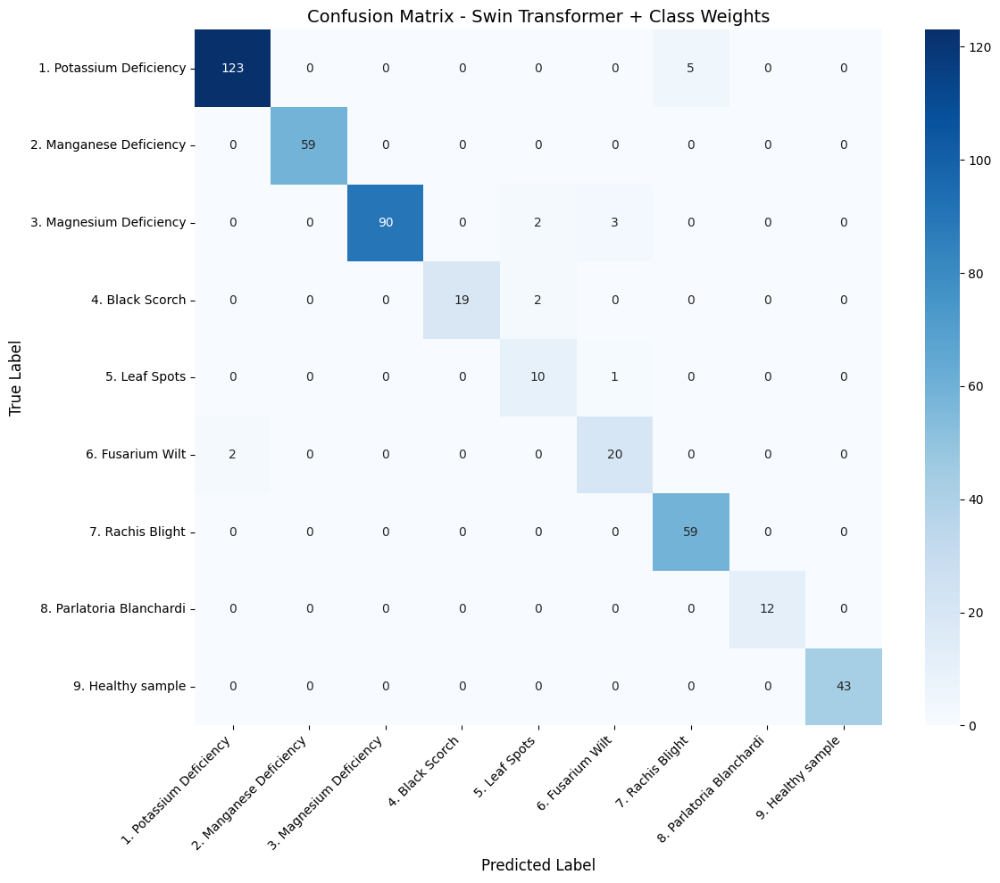

In [ ]:
# ============================================================
# FINAL CONFUSION MATRIX
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(12, 10))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.title(
    "Confusion Matrix - Swin Transformer + Class Weights",
    fontsize=14
)

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

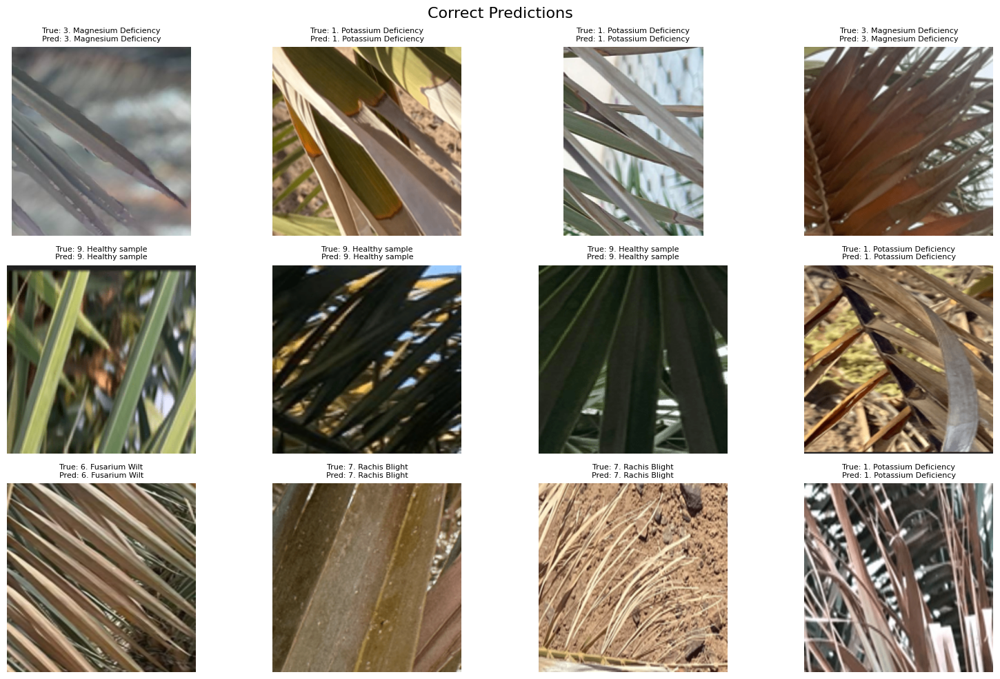

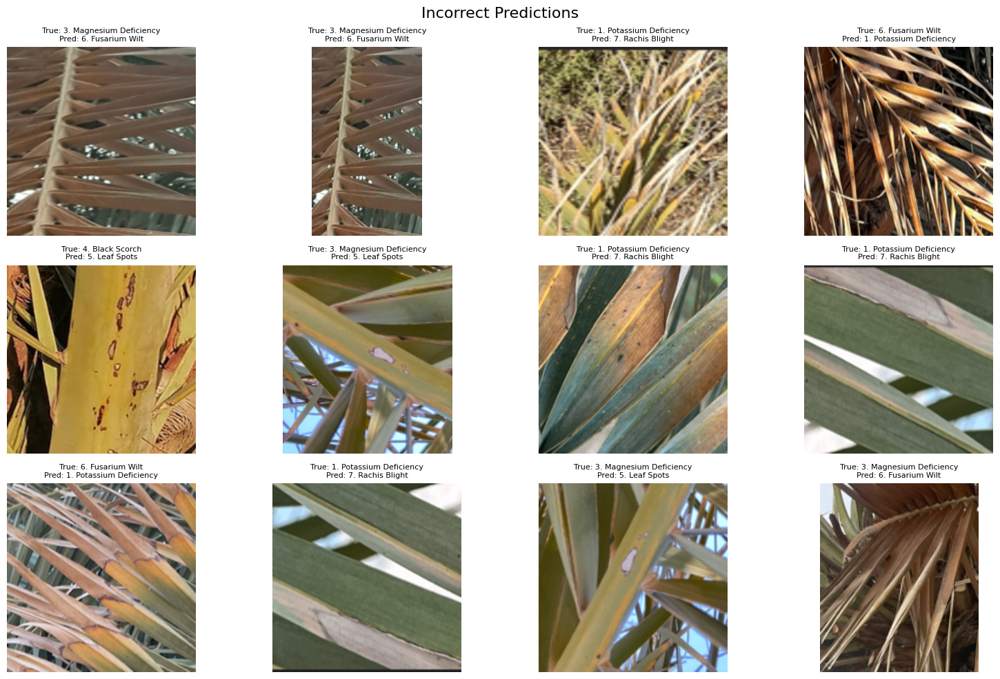

In [ ]:
# ============================================================
# FINAL PREDICTIONS VISUALIZATION
# Correct vs Incorrect Predictions
# ============================================================

import random
from PIL import Image

test_results = test_df.copy()

test_results["true_label"] = label_encoder.inverse_transform(all_labels)

test_results["predicted_label"] = label_encoder.inverse_transform(all_preds)

test_results["correct"] = (
    test_results["true_label"]
    ==
    test_results["predicted_label"]
)

def show_predictions(df, title, n=12):

    samples = df.sample(
        min(n, len(df)),
        random_state=42
    )

    plt.figure(figsize=(16, 10))

    for i, (_, row) in enumerate(samples.iterrows()):

        img = Image.open(row["path"]).convert("RGB")

        plt.subplot(3, 4, i + 1)

        plt.imshow(img)

        plt.axis("off")

        plt.title(
            f"True: {row['true_label']}\nPred: {row['predicted_label']}",
            fontsize=8
        )

    plt.suptitle(title, fontsize=16)

    plt.tight_layout()

    plt.show()

# Correct predictions
show_predictions(
    test_results[test_results["correct"] == True],
    "Correct Predictions",
    n=12
)

# Incorrect predictions
show_predictions(
    test_results[test_results["correct"] == False],
    "Incorrect Predictions",
    n=12
)

,epoch,train_loss,train_acc,val_loss,val_acc
0,1,0.7660,0.7462,0.3894,0.8782
1,2,0.3284,0.8964,0.4802,0.8397
2,3,0.2476,0.9134,0.4716,0.8632
3,4,0.1408,0.9544,0.2927,0.9124
4,5,0.0842,0.9673,0.2674,0.9316
5,6,0.0680,0.9770,0.3005,0.9081
6,7,0.0539,0.9802,0.2556,0.9402
7,8,0.0366,0.9876,0.3555,0.9359
8,9,0.1459,0.9558,0.2637,0.9167
9,10,0.0633,0.9747,0.3545,0.9530


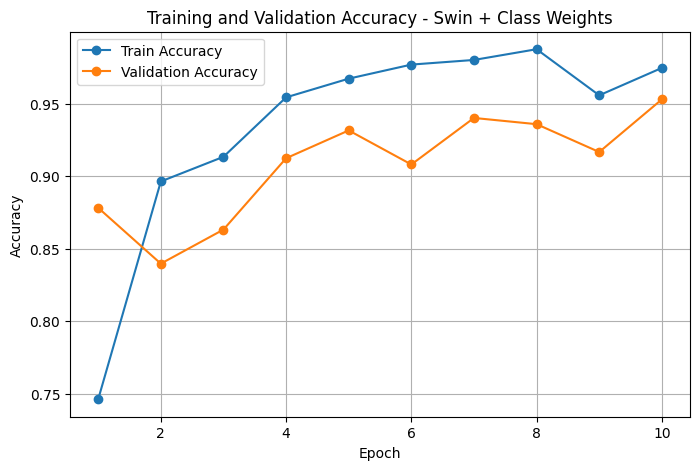

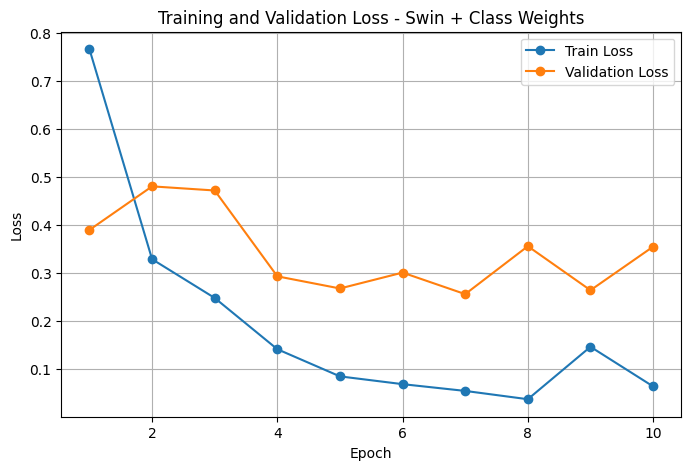

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

epochs = list(range(1, 11))

train_loss = [0.7660, 0.3284, 0.2476, 0.1408, 0.0842, 0.0680, 0.0539, 0.0366, 0.1459, 0.0633]
train_acc  = [0.7462, 0.8964, 0.9134, 0.9544, 0.9673, 0.9770, 0.9802, 0.9876, 0.9558, 0.9747]

val_loss = [0.3894, 0.4802, 0.4716, 0.2927, 0.2674, 0.3005, 0.2556, 0.3555, 0.2637, 0.3545]
val_acc  = [0.8782, 0.8397, 0.8632, 0.9124, 0.9316, 0.9081, 0.9402, 0.9359, 0.9167, 0.9530]

history_10_df = pd.DataFrame({
    "epoch": epochs,
    "train_loss": train_loss,
    "train_acc": train_acc,
    "val_loss": val_loss,
    "val_acc": val_acc
})

display(history_10_df)

history_10_df.to_csv(
    "/content/drive/MyDrive/Computer Vision Project/classweights_10epochs_training_history_manual.csv",
    index=False
)

plt.figure(figsize=(8, 5))
plt.plot(epochs, train_acc, marker="o", label="Train Accuracy")
plt.plot(epochs, val_acc, marker="o", label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy - Swin + Class Weights")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(epochs, train_loss, marker="o", label="Train Loss")
plt.plot(epochs, val_loss, marker="o", label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss - Swin + Class Weights")
plt.legend()
plt.grid(True)
plt.show()